<h1 align="center"> Image Captioning With Attention</h1>

In this notebook you will teach network to use attention during captioning images.

Here is what we need to do:
1. Take pretrained VGG19 to build feature vectors for positions of images.
2. Stack LSTM with attention on top of that.
3. Train the model, draw attention maps.

This assignment is based on Alexander Panin's captioning assignment (https://github.com/yandexdataschool/Practical_DL/blob/spring2019/homework04/homework04_basic_part2_image_captioning.ipynb) and on the paper "Show, Attend and Tell" (https://arxiv.org/abs/1502.03044).

In [295]:
import os
os.environ['CUDA_VISIBLE_DEVICES'] = '0'

In [296]:
import json

In [297]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

In [298]:
from tqdm import tqdm
import h5py

In [299]:
# you may need to install h5py, tqdm
#!pip install h5py tqdm
import sys
!{sys.executable} -m pip install h5py tqdm

You should consider upgrading via the 'c:\Users\fastaki\PycharmProjects\pythonProject\venv\Scripts\python.exe -m pip install --upgrade pip' command.


## Data structure

To save your time, we've already vectorized all MSCOCO17 images with a pre-trained VGG19 network from [torchvision](https://github.com/pytorch/vision/blob/master/torchvision/models/vgg.py).

The whole process takes anywhere between a day on CPU and 30min on 1x GeForce GTX 1060. If you want to play with that yourself, [you're welcome](https://github.com/nadiinchi/dl_labs/blob/master/ht_attention_preprocess_data.ipynb).

Please either download data from [here](https://yadi.sk/d/KGh1SngBWH4stg) or generate it manually using the above script.

In [300]:
f = h5py.File(r'C:\Users\fastaki\PycharmProjects\pythonProject\DL\StyleTransfer\3\img_codes.hdf5', 'r')
img_codes = f['data']

In [301]:
captions = json.load(open('captions_tokenized.json'))

In [302]:
print("Each image code is a 512x9x9-unit tensor [ shape: %s x %s ]" % (str(len(img_codes)), str(img_codes[0].shape)))
print(img_codes[0][:3].round(2), end='\n\n')
print("For each image there are 5 reference captions, e.g.:\n")
print('\n'.join(captions[0]))

Each image code is a 512x9x9-unit tensor [ shape: 118287 x (512, 9, 9) ]
[[[0.   0.   0.   0.   0.07 0.69 0.   0.   0.  ]
  [0.   0.24 0.   0.   0.63 1.94 1.21 0.72 0.46]
  [0.77 0.76 0.   0.   0.   0.88 1.65 2.37 1.14]
  [0.21 0.   0.   0.   2.8  3.3  2.93 6.29 3.48]
  [0.   0.   0.   0.   3.29 3.81 2.24 2.76 0.01]
  [0.   0.   0.   1.18 0.32 0.08 0.   0.   0.  ]
  [1.02 1.76 0.89 1.77 0.   0.   0.   0.   0.  ]
  [0.   1.36 0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.09 0.3  0.  ]]

 [[0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.   0.   0.   0.  ]
  [0.   0.   0.   0.17 0.   0.   0.   0.   0.  ]
  [0.   0.95 0.   0.   0.   0.   0.   0.   0.  ]
  [0.34 1.5  0.   0.   0.36 0.   0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.23 0.   0.   0.  ]
  [0.   0.   0.   0.   0.   0.52 0.   0.   0.  ]
  [0.   0.34 0.   0.   0.   0.   0.86 0.34 0.  ]
  [0.   0.47 0.26 0.41 0.   0.   1.08 0.38 0.  ]]

 [[1.09 3.03 2.15 0.65 0.   0.   1.06 0.2

As you can see, all captions are already tokenized and lowercased. We now want to split them and add some special tokens for start/end of caption.

In [303]:
#split descriptions into tokens
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 
        captions[img_i][caption_i] = ["#START#"]+sentence.split(' ')+["#END#"]

You don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts. 

We want you to __count the occurences of each word__ so that we can decide which words to keep in our vocabulary.

In [304]:
# Build a Vocabulary
from collections import Counter
word_counts = Counter()

#Compute word frequencies for each word in captions. See code above for data structure
for img_i in range(len(captions)):
    for caption_i in range(len(captions[img_i])):
        sentence = captions[img_i][caption_i] 

        word_counts.update(Counter(sentence))

In [305]:
vocab  = ['#UNK#', '#START#', '#END#', '#PAD#']
vocab += [k for k, v in word_counts.items() if v >= 5 if k not in vocab]
n_tokens = len(vocab)
print(len(vocab))

assert 10000 <= n_tokens <= 10500

word_to_index = {w: i for i, w in enumerate(vocab)}

10403


In [306]:
eos_ix = word_to_index['#END#']
unk_ix = word_to_index['#UNK#']
pad_ix = word_to_index['#PAD#']

def as_matrix(sequences, max_len=None):
    """ Convert a list of tokens into a matrix with padding """
    max_len = max_len or max(map(len,sequences))
    
    matrix = np.zeros((len(sequences), max_len), dtype='int32') + pad_ix
    for i,seq in enumerate(sequences):
        row_ix = [word_to_index.get(word, unk_ix) for word in seq[:max_len]]
        matrix[i, :len(row_ix)] = row_ix
    
    return matrix

In [307]:
#try it out on several descriptions of a random image
as_matrix(captions[1337])

array([[   1,   14,  287,  141,   14, 1130,  256,   62,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,  287,   62,   14, 1130,  256,  141,   14, 1291,    2,
           3,    3,    3],
       [   1,   14,   90,  141,   14, 1291,   62,   44,    5,   14, 1287,
          13,    2,    3],
       [   1,   14, 1238, 1370,   14, 1291,   62,   14,   73,   74,   13,
           2,    3,    3],
       [   1,   14,   90,   18,   71,  342,  141,   14, 1291,   62,   14,
        1287,   13,    2]])

## Building our neural network

As we mentioned earlier, we shall build an rnn "language-model" conditioned on the features from the convolutional part. 

We'll unbox the inception net later to save memory, for now just pretend that it's available.

In [308]:
import torch, torch.nn as nn
import torch.nn.functional as F

### Attention

There are $K$ objects that you can pay attention to.
Each object is characterized by the key $k_i$ and the value $v_i$.
The attention layer proceeds queries.
For the query $q$, the layer returns a weighted sum of the values of the objects, with weights proportional to the degree of key matching the query:
$$w_i = \frac{\exp(score(q, k_i))}{\sum_{j=1}^K\exp(score(q, k_j))}$$
$$a = \sum_{i=1}^K w_i v_i$$

Here we use $score(q, k) = \frac{q^Tk}{\sqrt{dim(k)}}$, where $dim(k)$ is the dimensionality of the key (which also equals the dimensionality of the query).
For more information see the paper Vaswani et al. "Attention Is All You Need", 2017.

_Hint:_ It is recommended to pay attention to the function torch.bmm, it may be useful below.

#### Score function layer

In [309]:
class ScaledDotProductScore(nn.Module):
    """
    Vaswani et al. "Attention Is All You Need", 2017.
    """
    def __init__(self):
        super().__init__()

    def forward(self, queries, keys):
        """
        queries:  [batch_size x num_queries x dim]
        keys:     [batch_size x num_objects x dim]
        Returns a tensor of scores with shape [batch_size x num_queries x num_objects].
        """
        result = torch.bmm(queries, keys.permute(0, 2, 1)) / np.sqrt(keys.size(2))
        return result

Test for ScaledDotProductScore

In [310]:
q = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 1, 0, 0],
    [1, 0, 0, 0, 0],
]], dtype=torch.float32)
o = torch.tensor([[
    [0, 0, 0, 0, 1],
    [0, 0, 0, 1, 0],
    [0, 0, 1, 0, 0],
    [0, 1, 0, 0, 0],
]], dtype=torch.float32)
print(ScaledDotProductScore()(q, o))

tensor([[[0.4472, 0.0000, 0.0000, 0.0000],
         [0.0000, 0.0000, 0.4472, 0.0000],
         [0.0000, 0.0000, 0.0000, 0.0000]]])


#### Attention layer

In [311]:
class Attention(nn.Module):
    def __init__(self, scorer):
        super().__init__()
        self.scorer = scorer

    def forward(self, queries, keys, values):
        """
        queries:         [batch_size x num_queries x query_feature_dim]
        keys:            [batch_size x num_objects x key_feature_dim]
        values:          [batch_size x num_objects x obj_feature_dim]
        Returns matrix of responses for queries with shape [batch_size x num_queries x obj_feature_dim].
        Saves detached weights as self.attention_map.
        """
        scores = self.scorer(queries, keys)
        softmax = nn.Softmax(2)
        weights = softmax(scores)

        self.attention_map = weights.detach()
        
        result = torch.bmm(weights, values) # batch_size x num_queries x obj_feature_dim
        return result

Tests for Attention layer

In [312]:
attn = Attention(ScaledDotProductScore())

In [313]:
q = torch.randn(2, 3, 5)
k = torch.randn(2, 4, 5)
v = torch.randn(2, 4, 7)
assert attn(q, k, v).shape == (2, 3, 7)

In [314]:
q = torch.tensor([[
    [0.01],
    [1],
    [100],
]], dtype=torch.float32)
o = torch.tensor([[
    [-1],
    [0],
    [1],
]], dtype=torch.float32) * 1000
a = attn(q, o, o)
assert torch.isnan(attn.attention_map).sum() == 0
assert torch.isnan(a).sum() == 0

In [315]:
q = torch.tensor([[
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
k = torch.tensor([[
    [0, 0],
    [0, 1],
    [1, 0],
]], dtype=torch.float32)
v = torch.tensor([[
    [0],
    [1],
    [2],
]], dtype=torch.float32)
a = attn(q, k, v)
print('Attention map:\n', attn.attention_map)
print('Responses:\n', a)

Attention map:
 tensor([[[0.2483, 0.5035, 0.2483],
         [0.2483, 0.2483, 0.5035]]])
Responses:
 tensor([[[1.0000],
         [1.2552]]])


### Language model

In [316]:
class CaptionNet(nn.Module):
    def __init__(self, n_tokens=n_tokens, emb_size=128, lstm_units=256, cnn_channels=512):
        """ A recurrent 'head' network for image captioning. Read scheme below. """
        super(self.__class__, self).__init__()
        
        # a layer that converts conv features to 
        self.cnn_to_h0 = nn.Linear(cnn_channels, lstm_units)
        self.cnn_to_c0 = nn.Linear(cnn_channels, lstm_units)
        
        # recurrent part, please create the layers as per scheme above.

        # create embedding for input words. Use the parameters (e.g. emb_size).
        self.emb = nn.Embedding(num_embeddings=n_tokens, 
                                embedding_dim=emb_size,
                                padding_idx=pad_ix)
            
        # attention: create attention over image spatial positions
        # The query is previous lstm hidden state, the keys are transformed cnn features,
        # the values are cnn features
        self.attention =  Attention(ScaledDotProductScore())
        
        # attention: create transform from cnn features to the keys
        # Hint: one linear layer shoud work
        # Hint: the dimensionality of keys should be lstm_units as lstm
        #       hidden state is the attention query
        self.cnn_to_attn_key = nn.Linear(cnn_channels, lstm_units)
                
        # lstm: create a recurrent core of your network. Use LSTMCell
        self.lstm = nn.LSTMCell(cnn_channels + emb_size, lstm_units)

        # create logits: MLP that takes attention response, lstm hidden state
        # and the previous word embedding as an input and computes one number per token
        # Hint: I used an architecture with one hidden layer, but you may try deeper ones
        self.logits_mlp = nn.Sequential(
            nn.Linear(cnn_channels + emb_size + lstm_units, 512), # <YOUR CODE>
            nn.ReLU(),
            nn.Linear(512, n_tokens),
        )
        
    def forward(self, image_features, captions_ix):
        """ 
        Apply the network in training mode. 
        :param image_features: torch tensor containing VGG features for each position.
                               shape: [batch, cnn_channels, width * height]
        :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
            padded with pad_ix
        :returns: logits for next token at each tick, shape: [batch, word_i, n_tokens]
        """
        initial_cell = self.cnn_to_c0(image_features.mean(2))
        initial_hid = self.cnn_to_h0(image_features.mean(2))
        
        image_features = image_features.transpose(1, 2)
        
        # compute embeddings for captions_ix
        captions_emb = self.emb(captions_ix)
        
        # apply recurrent layer to captions_emb.
        # 1. initialize lstm state with initial_* from above
        # 2. In the recurrent loop over tokens:
        #   2.1. transform image vectors to the keys for attention
        #   2.2. use previous lstm state as an attention query and image vectors as values
        #   2.3. apply attention to obtain context vector
        #   2.4. store attention map
        #   2.5. feed lstm with current token embedding concatenated with context vector
        #   2.6. update lstm hidden and cell vectors
        #   2.7. store current lstm hidden state, attention response, and the previous word embedding
        # reccurent_out should be lstm hidden state sequence
        # of shape [batch, caption_length, lstm_units + cnn_channels + emb_size]
        # attention_map should be attention maps sequence
        # of shape [batch, caption_length, width * height]
        reccurent_out = []
        attention_map = []
        
        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        lstm_state = (initial_hid, initial_cell)
        for i in range(captions_ix.size(1)): # self.n_tokens # captions_emb
            keys_attention = self.cnn_to_attn_key(image_features)
            attn_query, _  = lstm_state
            
            context_vector = self.attention(attn_query.unsqueeze(1), keys_attention, image_features)
            attn_map = self.attention.attention_map # batch_size x num_queries x num_objects
            hidd, cell = self.lstm(
                torch.cat([captions_emb[:, i, :], context_vector.squeeze(1)], dim=1),
                lstm_state)
            lstm_state = (hidd, cell)
            
            qqq = torch.cat((hidd,context_vector.squeeze(1), captions_emb[:,i,:]), dim=1)
            reccurent_out.append(qqq) #reccurent_out.append(hidd)
            attention_map.append(attn_map)
        
        reccurent_out = torch.stack(reccurent_out, dim=1)
        attention_map = torch.stack(attention_map, dim=1).squeeze(2)

        # compute logits for next token probabilities
        # based on the stored in (2.7) values (reccurent_out)
        logits = self.logits_mlp(reccurent_out)   # <YOUR_CODE>
        
        # return logits and attention maps from (2.4)
        return logits, attention_map

In [317]:
network = CaptionNet(n_tokens)

In [318]:
dummy_img_vec = torch.randn(len(captions[0]), 512, 81)
dummy_capt_ix = torch.tensor(as_matrix(captions[0]), dtype=torch.int64)

dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)
dummy_logits, dummy_attention_map = network.forward(dummy_img_vec, dummy_capt_ix)

print('logits shape:', dummy_logits.shape)
print('attention map shape:', dummy_attention_map.shape)
assert dummy_logits.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], n_tokens)
assert dummy_attention_map.shape == (dummy_capt_ix.shape[0], dummy_capt_ix.shape[1], 81)

logits shape: torch.Size([5, 14, 10403])
attention map shape: torch.Size([5, 14, 81])


#### Train loss function

In [319]:
def compute_loss(network, image_features, captions_ix):
    """
    :param image_features: torch tensor containing VGG features. shape: [batch, cnn_channels, width * height]
    :param captions_ix: torch tensor containing captions as matrix. shape: [batch, word_i]. 
        padded with pad_ix
    :returns: crossentropy (neg llh) loss for next captions_ix given previous ones plus 
              attention regularizer. Scalar float tensor
    """
    
    if next(network.parameters()).is_cuda:
        image_features, captions_ix = image_features.cuda(), captions_ix.cuda()
    
    # captions for input - all except last cuz we don't know next token for last one.
    captions_ix_inp = captions_ix[:, :-1].contiguous()
    captions_ix_next = captions_ix[:, 1:].contiguous()
    
    # apply the network, get predictions, attnetion map and gates for captions_ix_next
    logits_for_next, attention_map = network.forward(image_features, captions_ix_inp)
    
    
    # compute the loss function between logits_for_next and captions_ix_next
    # Use the mask, Luke: make sure that predicting next tokens after EOS do not contribute to loss
    # you can do that either by multiplying elementwise loss by (captions_ix_next != pad_ix)
    # or by using ignore_index in some losses.
    
    captions_ix_next *= (captions_ix_next != pad_ix)
    captions_ix_next = captions_ix_next.reshape(-1)
    logits_for_next = logits_for_next.reshape((-1, logits_for_next.size(2)))
    loss = nn.CrossEntropyLoss()(logits_for_next, captions_ix_next)

    # the regularizer for attention - this one requires the attention over each position to sum up to 1,
    # i. e. to look at the whole image during sentence generation process
    mask = (captions_ix_inp != pad_ix)
    masked_attention_map = attention_map * mask[:, :, None].float()
    regularizer = ((1 - masked_attention_map.sum(1)) ** 2).mean()
    
    return loss + regularizer

In [320]:
dummy_loss = compute_loss(network, dummy_img_vec, dummy_capt_ix)

assert len(dummy_loss.shape) <= 1, 'loss must be scalar'
assert dummy_loss.detach().cpu().numpy() > 0, "did you forget the 'negative' part of negative log-likelihood"

dummy_loss.backward()

assert all(param.grad is not None for param in network.parameters()), \
        'loss should depend differentiably on all neural network weights'

#### Optimizer
Create ~~adam~~ your favorite optimizer for the network.

In [321]:
trainable_parametrs = list(network.parameters()) 
optimizer = torch.optim.Adam(trainable_parametrs, lr=1e-3)

# Training

* First make train/val split without extra memory usage
* Implement the batch generator
* Than train the network as usual

In [322]:
from torch.utils.data import Dataset

class IdxDataset(Dataset):
    def __init__(self, dataset, idx):
        self.dataset = dataset
        self.idx = idx
    
    def __len__(self):
        return len(self.idx)
        
    def __getitem__(self, idx):
        return self.dataset[self.idx[idx]]

In [323]:
captions = np.array(captions)

np.random.seed(42)
perm = np.random.permutation(len(img_codes))
threshold = round(len(img_codes) * 0.1)
train_img_idx, val_img_idx = perm[threshold:], perm[: threshold]

train_img_idx.sort()
val_img_idx.sort()
train_img_codes = IdxDataset(img_codes, train_img_idx)
val_img_codes = IdxDataset(img_codes, val_img_idx)
train_captions = IdxDataset(captions, train_img_idx)
val_captions = IdxDataset(captions, val_img_idx)

C:\Users\fastaki\AppData\Local\Temp/ipykernel_5508/2624119931.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  captions = np.array(captions)


In [324]:
from random import choice

last_batch_end = {}

def generate_batch(img_codes, captions, batch_size, max_caption_len=None):
    
    #sample sequential numbers for image/caption indicies (for trainign speed up)
    global last_batch_end
    random_image_ix = np.arange(batch_size, dtype='int') + last_batch_end.get(len(img_codes), 0)
    last_batch_end[len(img_codes)] = last_batch_end.get(len(img_codes), 0) + batch_size
    if last_batch_end[len(img_codes)] + batch_size >= len(img_codes):
        last_batch_end[len(img_codes)] = 0
    
    #get images
    batch_images = np.vstack([img_codes[i][None] for i in random_image_ix])
    batch_images = batch_images.reshape(batch_images.shape[0], batch_images.shape[1], -1)
    
    #5-7 captions for each image
    captions_for_batch_images = captions[random_image_ix]
    
    #pick one from a set of captions for each image
    batch_captions = list(map(choice,captions_for_batch_images))
    
    #convert to matrix
    batch_captions_ix = as_matrix(batch_captions,max_len=max_caption_len)
    
    return torch.tensor(batch_images, dtype=torch.float32), torch.tensor(batch_captions_ix, dtype=torch.int64)

In [325]:
generate_batch(img_codes, captions, 3)

(tensor([[[0.0000, 0.0000, 0.0000,  ..., 0.0941, 0.2962, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.0764, 0.3785, 0.0000],
          [1.0881, 3.0323, 2.1466,  ..., 0.9595, 1.1179, 0.9478],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0711,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 1.1465, 1.6479, 1.6033]],
 
         [[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.3930, 0.9311],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ...,

### Main loop

Train on minibatches just as usual. Evaluate on val from time to time.

##### TIps
* If training loss has become close to 0 or model produces garbage,
    double-check that you're predicting __next__ words, not current or t+2'th words.
* If the model generates fluent captions that have nothing to do with the images
 * this may be due to recurrent net not receiving image vectors.
 * alternatively it may be caused by gradient explosion, try clipping 'em or just restarting the training
 * finally, you may just need to train the model a bit more


* Crossentropy is a poor measure of overfitting
 * Model can overfit validation crossentropy but keep improving validation quality.
 * Use human _(manual)_ evaluation or try automated metrics: [cider](https://github.com/vrama91/cider) or [bleu](https://www.nltk.org/_modules/nltk/translate/bleu_score.html)
 

* We recommend you to periodically evaluate the network using the next "apply trained model" block
 *  its safe to interrupt training, run a few examples and start training again
 
* The typical loss values should be around 3~5 if you average over time, scale by length if you sum over time. The reasonable captions began appearing at loss=3.5~3.7

In [326]:
batch_size = 64  # adjust me
n_epochs = 20    # adjust me
n_batches_per_epoch = 64  # adjust me
n_validation_batches = 8  # how many batches are used for validation after each epoch

In [327]:
from tqdm import tqdm

for epoch in range(n_epochs):
    if torch.cuda.is_available():
        network = network.cuda()
   
    train_loss=0
    network.train(True)
    with tqdm(range(n_batches_per_epoch)) as iterator:
        for _ in iterator:
            loss_t = compute_loss(network, *generate_batch(train_img_codes, train_captions, batch_size))
        
            # clear old gradients; do a backward pass to get new gradients; then train with opt
            optimizer.zero_grad()
            loss_t.backward()
            optimizer.step()
        
            train_loss += float(loss_t)
    train_loss /= n_batches_per_epoch
        
    val_loss=0
    network.train(False)
    for _ in range(n_validation_batches):
        loss_t = compute_loss(network, *generate_batch(val_img_codes, val_captions, batch_size))
        val_loss += float(loss_t)
    val_loss /= n_validation_batches
    
    if torch.cuda.is_available():
        network = network.cpu()

    print('\nEpoch: {}, train loss: {}, val loss: {}'.format(epoch, train_loss, val_loss), flush=True)

print("Finished!")

100%|██████████| 64/64 [00:04<00:00, 13.32it/s]



Epoch: 0, train loss: 4.153212908655405, val loss: 3.488176167011261


100%|██████████| 64/64 [00:06<00:00, 10.02it/s]



Epoch: 1, train loss: 3.003178732469678, val loss: 3.106736272573471


100%|██████████| 64/64 [00:04<00:00, 13.49it/s]



Epoch: 2, train loss: 2.9351123720407486, val loss: 2.733780860900879


100%|██████████| 64/64 [00:04<00:00, 14.39it/s]



Epoch: 3, train loss: 2.808111108839512, val loss: 2.5731673538684845


100%|██████████| 64/64 [00:04<00:00, 14.13it/s]



Epoch: 4, train loss: 2.67555028013885, val loss: 2.779696047306061


100%|██████████| 64/64 [00:04<00:00, 14.34it/s]



Epoch: 5, train loss: 2.6429694797843695, val loss: 2.6216366589069366


100%|██████████| 64/64 [00:04<00:00, 14.18it/s]



Epoch: 6, train loss: 2.6169110741466284, val loss: 2.6216742396354675


100%|██████████| 64/64 [00:04<00:00, 13.54it/s]



Epoch: 7, train loss: 2.502179829403758, val loss: 2.4864444732666016


100%|██████████| 64/64 [00:04<00:00, 13.84it/s]



Epoch: 8, train loss: 2.5442040655761957, val loss: 2.5889893621206284


100%|██████████| 64/64 [00:05<00:00, 11.85it/s]



Epoch: 9, train loss: 2.468521159142256, val loss: 2.418514460325241


100%|██████████| 64/64 [00:05<00:00, 11.98it/s]



Epoch: 10, train loss: 2.481480285525322, val loss: 2.49988454580307


100%|██████████| 64/64 [00:04<00:00, 13.45it/s]



Epoch: 11, train loss: 2.41126549243927, val loss: 2.341503143310547


100%|██████████| 64/64 [00:05<00:00, 12.14it/s]



Epoch: 12, train loss: 2.412137322127819, val loss: 2.3296190202236176


100%|██████████| 64/64 [00:08<00:00,  7.41it/s]



Epoch: 13, train loss: 2.430148584768176, val loss: 2.3707659542560577


100%|██████████| 64/64 [00:07<00:00,  8.82it/s]



Epoch: 14, train loss: 2.445371663197875, val loss: 2.393073260784149


100%|██████████| 64/64 [00:09<00:00,  6.48it/s]



Epoch: 15, train loss: 2.3768143262714148, val loss: 2.4070083498954773


100%|██████████| 64/64 [00:08<00:00,  7.27it/s]



Epoch: 16, train loss: 2.3353636898100376, val loss: 2.244141012430191


100%|██████████| 64/64 [00:05<00:00, 12.04it/s]



Epoch: 17, train loss: 2.317886048927903, val loss: 2.2387514263391495


100%|██████████| 64/64 [00:04<00:00, 13.60it/s]



Epoch: 18, train loss: 2.3561766482889652, val loss: 2.3831081688404083


100%|██████████| 64/64 [00:04<00:00, 14.06it/s]



Epoch: 19, train loss: 2.374849958345294, val loss: 2.3083425015211105
Finished!


### Apply trained model

Let's unpack our pre-trained VGG network and see what our model is capable of.

In [328]:
from torch import nn
import torch.nn.functional as F
from torchvision.models.vgg import VGG, cfgs as VGG_cfgs, make_layers
from warnings import warn
class BeheadedVGG19(VGG):
    """ Like torchvision.models.inception.Inception3 but the head goes separately """
    
    def forward(self, x):
        x_for_attn = x= self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        logits = x = self.classifier(x)
        return x_for_attn, logits
    
features_net = BeheadedVGG19(make_layers(VGG_cfgs['E'], batch_norm=False), init_weights=False)

from torch.utils.model_zoo import load_url
features_net_url = 'https://download.pytorch.org/models/vgg19-dcbb9e9d.pth'
features_net.load_state_dict(load_url(features_net_url))

features_net = features_net.train(False)
if torch.cuda.is_available():
    features_net = features_net.cuda()
features_net = nn.DataParallel(features_net)

### Generate caption

The function below creates captions by sampling from probabilities defined by the net.

The implementation used here is simple but inefficient (quadratic in lstm steps). We keep it that way since it isn't a performance bottleneck.

In [329]:
def generate_caption(image, caption_prefix = ("#START#",), 
                     t=1, sample=True, max_len=100):
    
    assert isinstance(image, np.ndarray) and np.max(image) <= 1\
           and np.min(image) >=0 and image.shape[-1] == 3
    
    image = torch.tensor(image.transpose([2, 0, 1]), dtype=torch.float32)
    
    vectors_9x9, logits = features_net(image[None])
    caption_prefix = list(caption_prefix)
    
    attention_maps = []
    
    for _ in range(max_len):
        
        prefix_ix = as_matrix([caption_prefix])
        prefix_ix = torch.tensor(prefix_ix, dtype=torch.int64)
        input_features = vectors_9x9.view(vectors_9x9.shape[0], vectors_9x9.shape[1], -1)
        if next(network.parameters()).is_cuda:
            input_features, prefix_ix = input_features.cuda(), prefix_ix.cuda()
        else:
            input_features, prefix_ix = input_features.cpu(), prefix_ix.cpu()
        next_word_logits, cur_attention_map = network(input_features, prefix_ix)
        next_word_logits = next_word_logits[0, -1]
        cur_attention_map = cur_attention_map[0, -1]
        next_word_probs = F.softmax(next_word_logits, -1).detach().cpu().numpy()
        attention_maps.append(cur_attention_map.detach().cpu())
        
        assert len(next_word_probs.shape) ==1, 'probs must be one-dimensional'
        next_word_probs = next_word_probs ** t / np.sum(next_word_probs ** t) # apply temperature

        if sample:
            next_word = np.random.choice(vocab, p=next_word_probs) 
        else:
            next_word = vocab[np.argmax(next_word_probs)]

        caption_prefix.append(next_word)

        if next_word=="#END#":
            break

    return caption_prefix, attention_maps

Here is the code which downloads image, prints different generated captions and visualize attention map.

In [330]:
from matplotlib import pyplot as plt
from skimage.transform import resize
from tempfile import mktemp
from os import remove
%matplotlib inline

# get and preprocess image
def obtain_image(filename=None, url=None):
    if (filename is None and url is None) or (filename is not None and url is not None):
        raise ValueError('You shoud specify either filename or url')
    if url is not None:
        tmpfilename = mktemp()
        #print(tmpfilename)
        !wget {url} -O {tmpfilename} -q
        img = plt.imread(tmpfilename)
        remove(tmpfilename)
    else:
        img = plt.imread(filename)
    img = resize(img, (299, 299), mode='wrap', anti_aliasing=True).astype('float32')
    return img

def show_img(img):
    plt.imshow(img)
    plt.axis('off')

def print_possible_captions(img, num_captions=10, temperature=5.):
    for i in range(num_captions):
        print(' '.join(generate_caption(img, t=temperature)[0][1:-1]))
        
def draw_attention_map(img, caption, attention_map):
    s = 4
    n = len(caption)
    w = 4
    h = n // w + 1
    plt.figure(figsize=(w * s, h * s))
    plt.subplot(h, w, 1)
    plt.imshow(img)
    plt.title('INPUT', fontsize=s * 4)
    plt.axis('off')
    for i, word, attention in zip(range(n), caption, attention_map):
        plt.subplot(h, w, 2 + i)
        attn_map = attention.view(1, 1, 9, 9)
        attn_map = F.interpolate(attn_map, size=(12, 12), mode='nearest')
        attn_map = F.interpolate(attn_map, size=(299, 299), mode='bilinear', align_corners=False)
        attn_map = attn_map[0, 0][:, :, None]
        attn_map = torch.min(attn_map / attn_map.max(), torch.ones_like(attn_map)).numpy()
        plt.imshow(img * attn_map)
        plt.title(word, fontsize=s * 4)
        plt.axis('off')

def process_image(img):
    print_possible_captions(img)
    c, am = generate_caption(img, t=5.)
    draw_attention_map(img, c[1:-1], am)

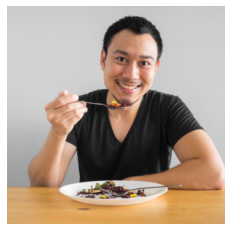

In [331]:
img = obtain_image(url="https://thecenterformindfuleating.org/resources/Pictures/asian%20man%20eating.jpg")
show_img(img)

a man with a tie and a tie
a man wearing a tie and a tie
a man is holding a piece of pizza on it .
a man in a suit and tie is holding a knife .
a man with a white shirt and a tie .
a man is holding a glass of wine on a table .
a man in a white shirt is holding a white shirt .
a man is eating a donut in a room .
a man holding a white shirt and a tie .
a man with a tie and a tie .


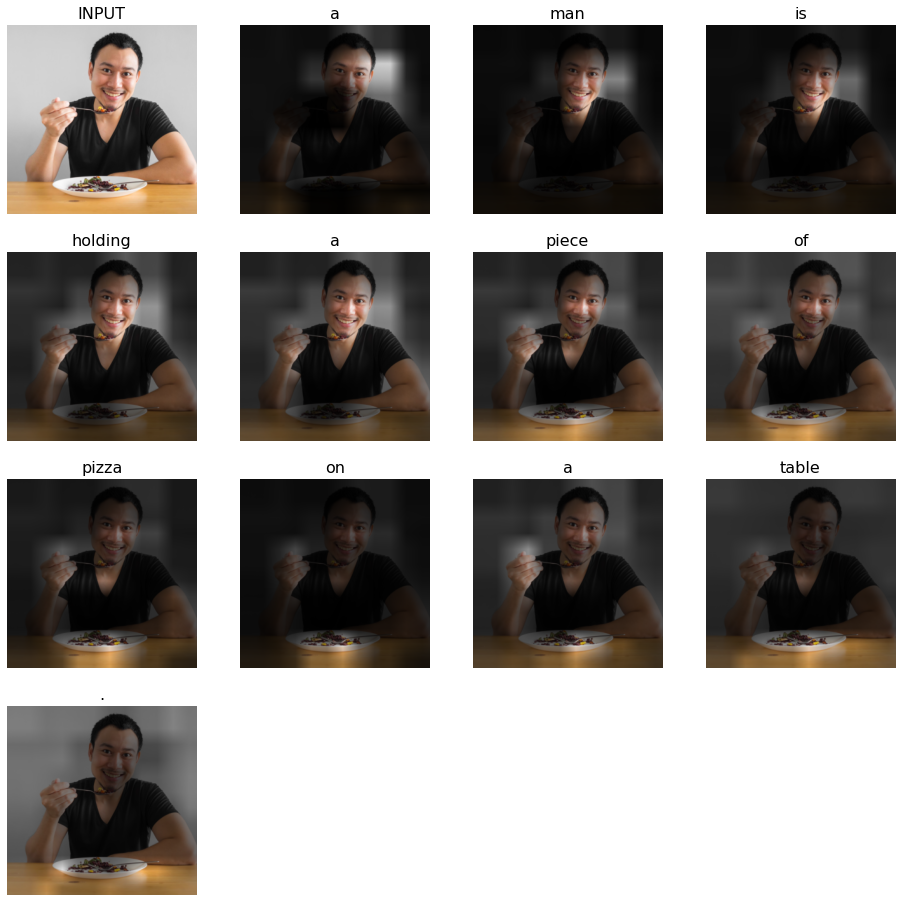

In [332]:
process_image(img)

a man riding a bike on a motorcycle .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a park bench .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a dirt road .
a man riding a bike on a bench .
a man riding a bike on a dirt road .


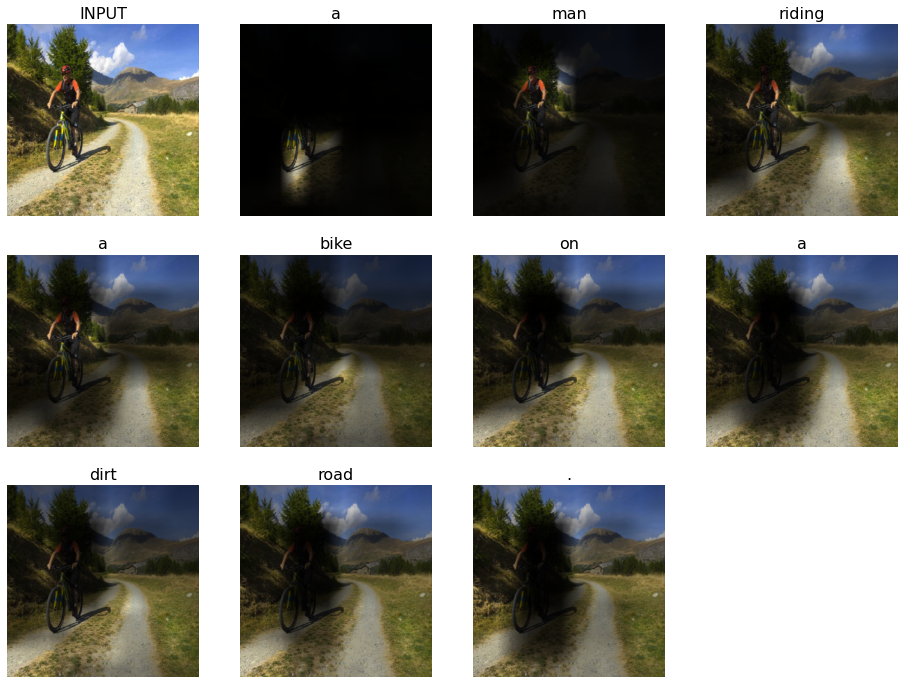

In [333]:
process_image(obtain_image(url="https://www.dimensioneattiva.it/wp-content/uploads/2016/10/Bike5.jpg"))

a black cat is sitting on a chair .
a cat laying on a chair with a cat .
a cat sitting on a green chair .
a cat is sitting on a chair .
a cat is sitting on a chair .
a cat is sitting on a wooden bench .
a cat is standing on a white chair
a cat is sitting on a chair with a cat .
a cat sitting on a chair with a cat .
a small cat is sitting on a chair .


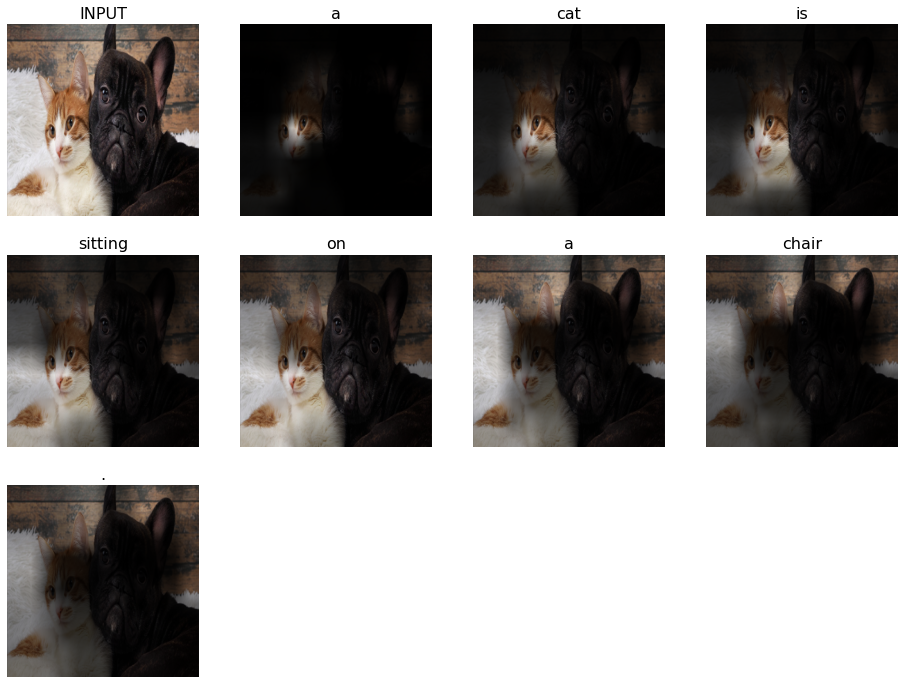

In [334]:
process_image(obtain_image(url="http://ccanimalclinic.com/wp-content/uploads/2017/07/Cat-and-dog-1.jpg"))

a man is jumping up a trick on a skateboard .
a man is jumping up a trick on a skateboard .
a man is jumping up a trick on a skateboard .
a man is jumping on a skateboard in the air .
a man is doing a trick on a skateboard .
a man is jumping up a trick on a skateboard .
a man is jumping on a skateboard in the air .
a man riding a skateboard on a skateboard .
a man is jumping up a trick on a skateboard .
a man in a red shirt is jumping a trick on a skateboard .


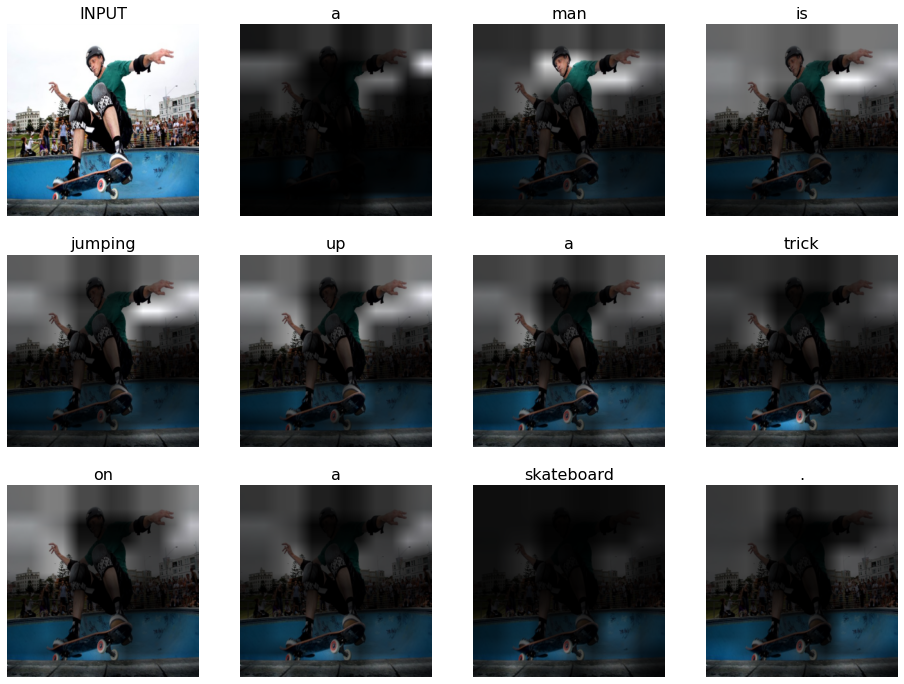

In [335]:
process_image(obtain_image(url="https://pixel.nymag.com/imgs/daily/selectall/2018/02/12/12-tony-hawk.w710.h473.jpg"))

In [338]:
process_image(obtain_image(filename="/home/oleg/usa00/IMG_20190520_125121.jpg"))
#don't know what is this file

FileNotFoundError: [Errno 2] No such file or directory: '/home/oleg/usa00/IMG_20190520_125121.jpg'

# Demo
### Find at least 10 images to test it on.
* Seriously, that's part of an assignment. Go get at least 10 pictures to get captioned
* Make sure it works okay on __simple__ images before going to something more comples
* Photos, not animation/3d/drawings, unless you want to train CNN network on anime
* Mind the aspect ratio

In [339]:
#apply your network on image sample you found
#
#
import re

a large building with a clock tower on it .
a tall tower with a clock tower on it .
a tall tower with a clock tower in the background .
a tall tower with a clock tower in the background .
a tall tower with a clock tower in the background .
a tall tower with a clock tower on it .
a tall tower with a clock tower on it .
a tall tower with a clock tower in the background .
a large building with a clock tower in the background .
a tall tower with a clock tower in the background .


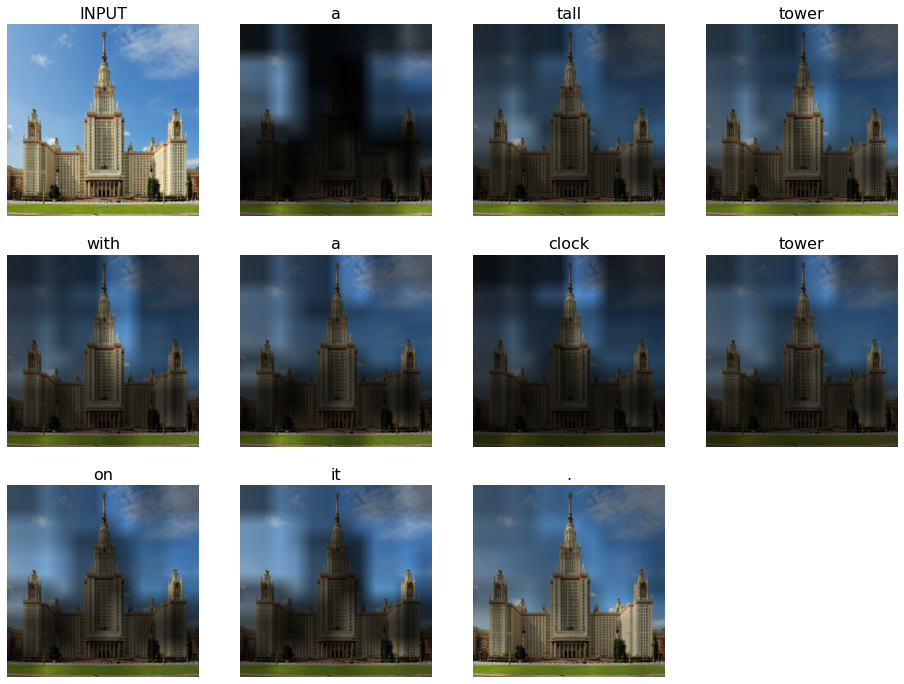

In [343]:
process_image(obtain_image(url="https://assets-global.website-files.com/599873abab717100012c91ea/5f104e58437a7bb6711a05f0_680921%20(1).jpg"))

a man in a black shirt and a tie .
a man is smiling with a cell phone in his hand .
a man sitting in a chair with a tie .
a man is in a suit and a tie .
a man is holding a cell phone in a room .
a man in a suit and tie is sitting in a chair .
a man with a tie and a tie .
a man with a tie and a tie .
a man is holding a wii remote in front of a laptop .
a man is smiling while a man with a cell phone .


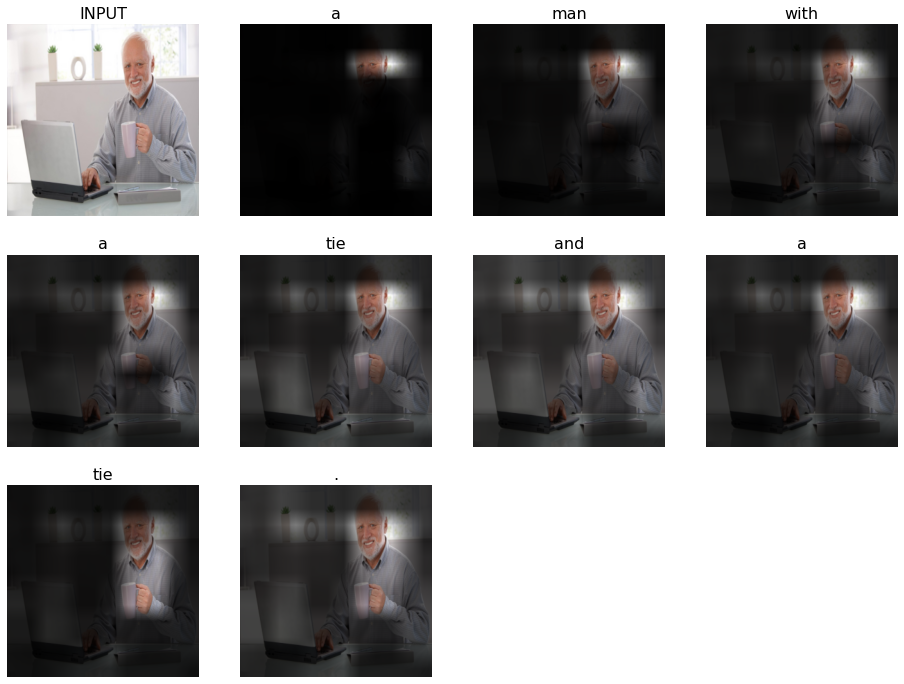

In [347]:
process_image(obtain_image(url="https://pbs.twimg.com/media/E0I92QqWYAA03my.jpg"))

a city bus on the street with a car .
a city bus driving down a street with a bus .
a bus is parked on the side of a city street .
a city bus driving down a city street .
a city street with a city bus and a car .
a city street with a city street and a bus .
a city street with a city street and a bus .
a bus is parked on a city street .
a city street with a city street and a bus .
a bus is parked on a city street .


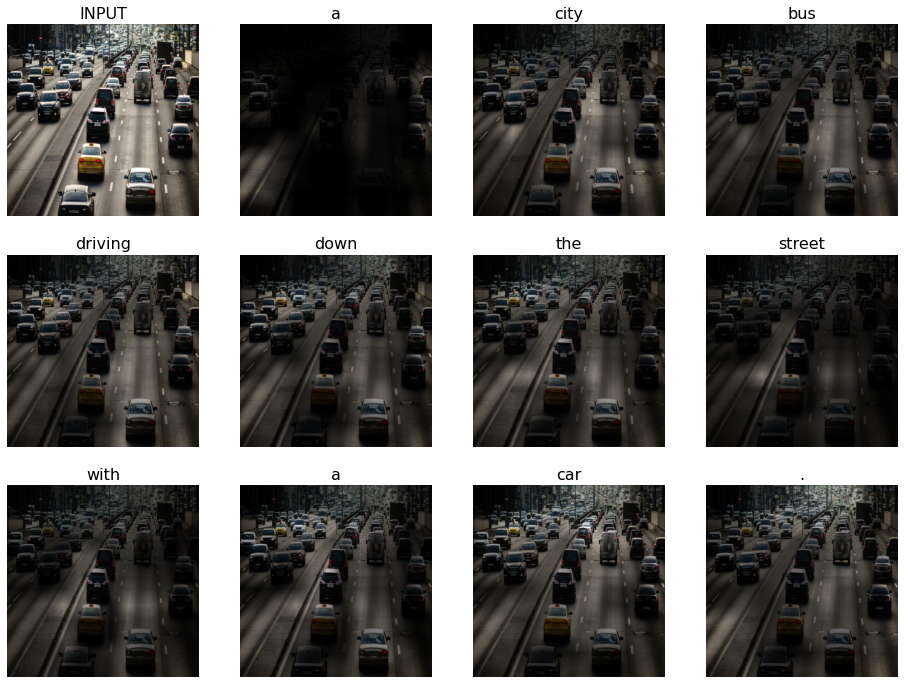

In [355]:
process_image(obtain_image(url="https://s0.rbk.ru/v6_top_pics/resized/1200xH/media/img/2/12/755853074027122.jpeg"))

a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a bat at a baseball game .
a baseball player swinging a baseball bat at a baseball game .


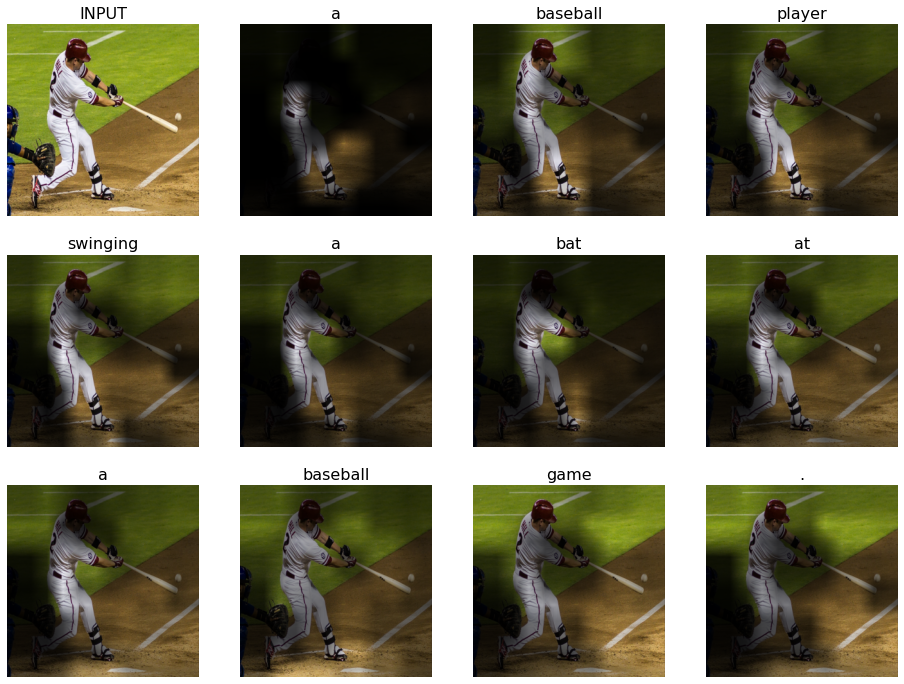

In [356]:
process_image(obtain_image(url="https://upload.wikimedia.org/wikipedia/commons/5/59/Aaron_Hill_on_July_22%2C_2013.jpg"))

a tall tower of a building with a clock tower .
a tall tower with a clock tower in the background .
a tall tower with a clock tower in the background .
a tall building with a clock tower in the background .
a large building with a clock tower in the background
a tall tower with a clock tower in the background .
a tall tower with a clock tower in the background .
a tall tower with a clock tower on it .
a tall tower with a clock tower in the background .
a large clock tower with a clock tower in the background .


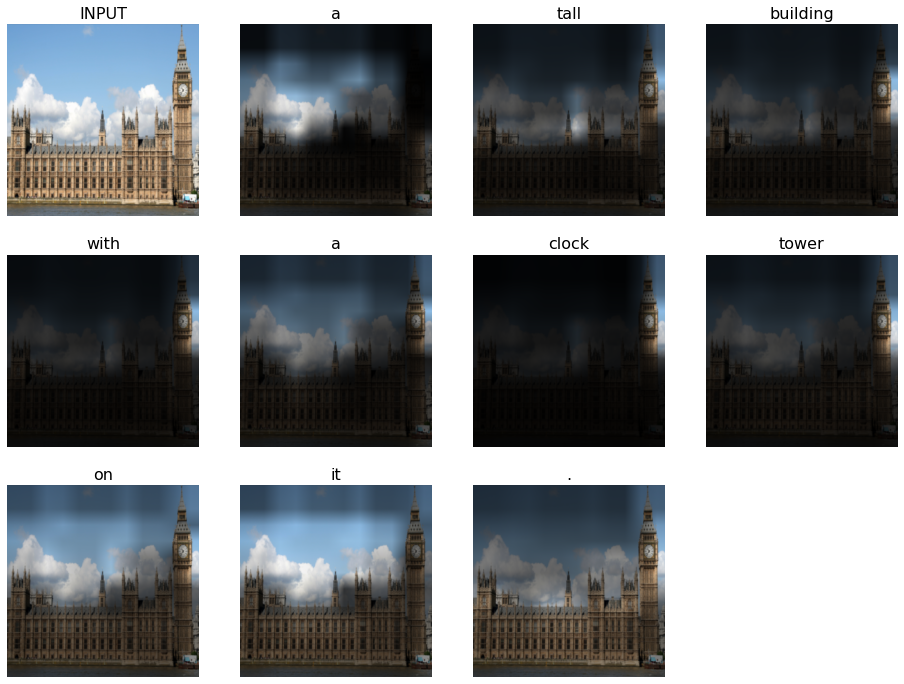

In [357]:
#5
process_image(obtain_image(url="https://funart.pro/uploads/posts/2021-04/1618687804_59-funart_pro-p-zdanie-parlamenta-v-londone-krasivie-mesta-61.jpg"))

a man is standing on a field with a dog .
a man is standing on a field with a dog .
a man is standing on a field with a dog .
a man is standing on a field with a dog .
a man is standing on a field with a dog .
a man standing on a field with a dog .
a man is standing on a field with a dog .
a man is standing on a field with a dog .
a man standing on a field with a dog .
a man is standing on a field with a dog .


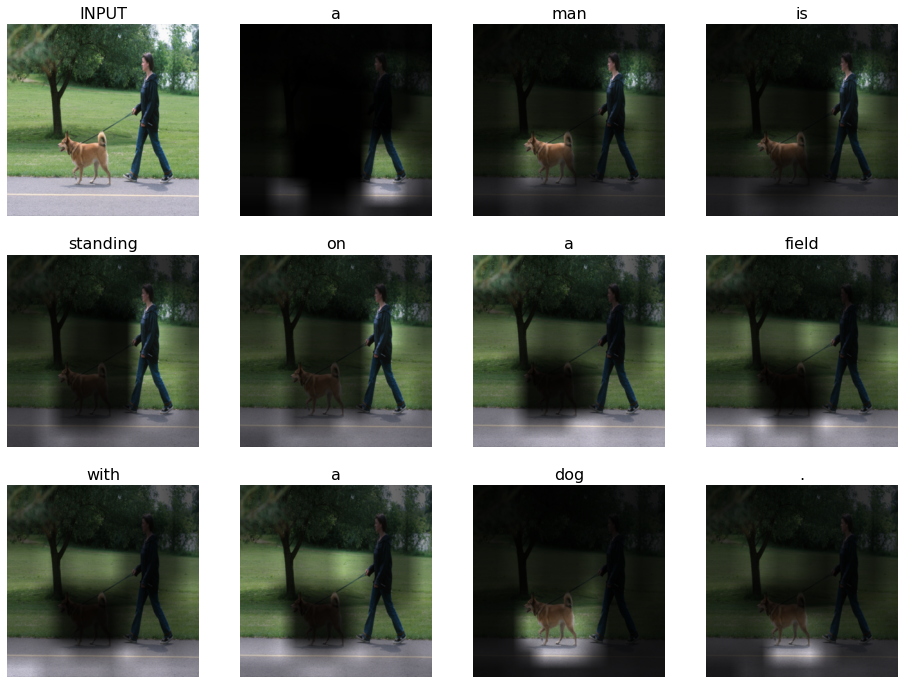

In [359]:
process_image(obtain_image(url="https://dailyhousehold.com/wp-content/uploads/2014/08/walking-aging-dog-mobility.jpg"))

a cat is standing on a green grass field .
a cat is sitting on a green grass field .
a cat is standing on a green grass field .
a cat is sitting on a green grass .
a cat is standing on a green grass field .
a cat is sitting on a green grass .
a cat is standing on a green grass field .
a cat is sitting on a green grass field .
a cat is sitting on a green grass field .
a cat is sitting on a green grass field .


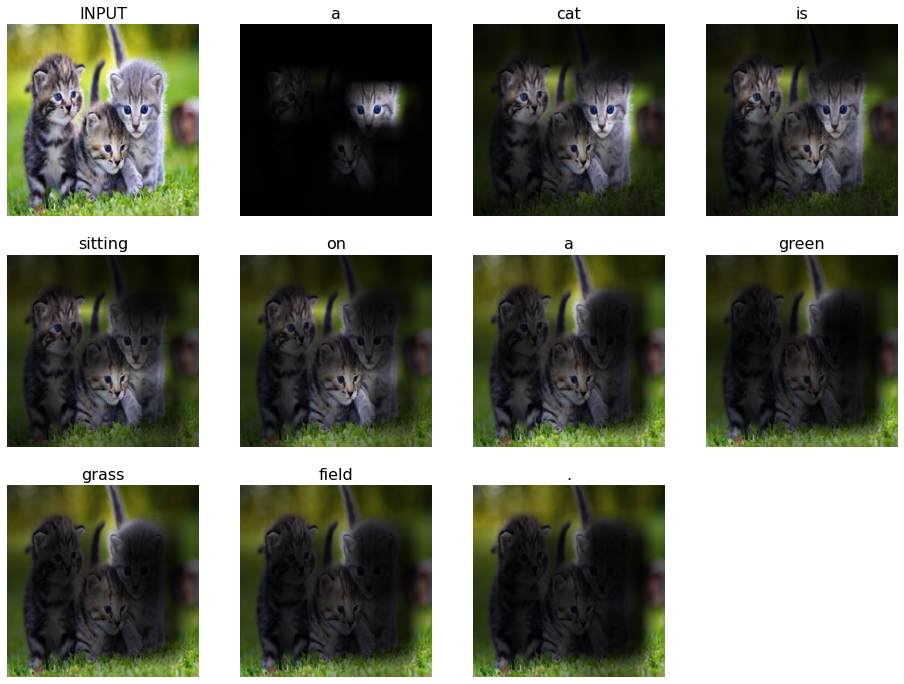

In [360]:
process_image(obtain_image(url="https://img.desktopwallpapers.ru/animals/pics/wide/1920x1200/c24f98eba82666ae547b138be9933bd1.jpg"))

a dog is standing on a chair .
a dog is standing on a white chair .
a white dog is sitting on a wooden bench .
a dog is sitting on a white chair .
a white dog is sitting on a wooden table .
a dog is sitting on a white chair .
a dog is sitting on a white chair .
a dog is standing in the middle of a chair .
a dog is sitting on a chair .
a dog is standing on a wooden table .


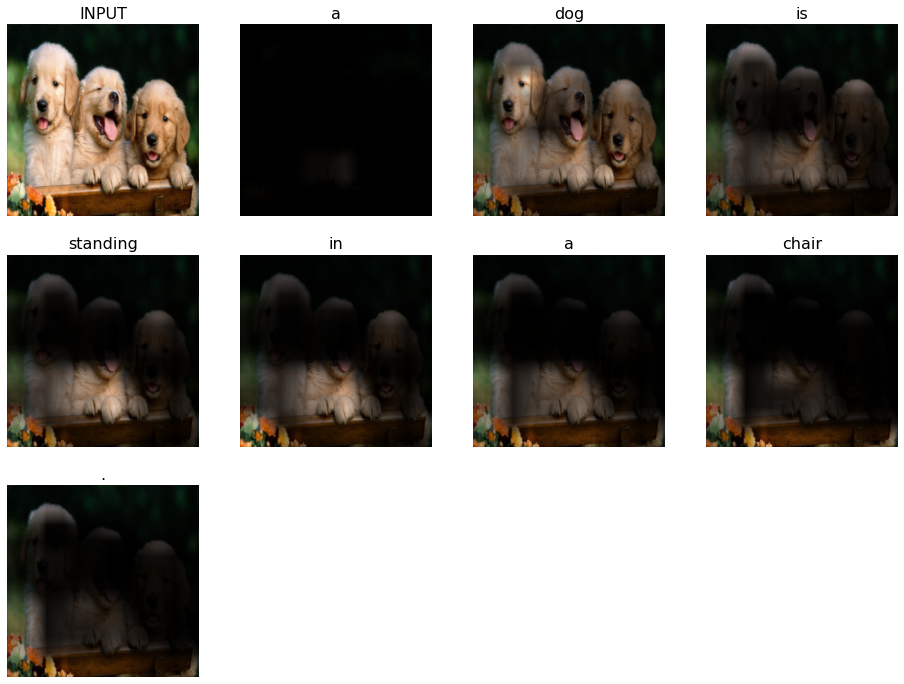

In [361]:
#8
process_image(obtain_image(url="https://wallpaperaccess.com/full/266689.jpg"))

a man with a cell phone in his hand .
a man with a cell phone on his cell phone .
a man with a cell phone with a cell phone .
a man is holding a cell phone in his hand .
a man holding a cell phone while holding a cell phone .
a man holding a cell phone in his hand .
a man with a cell phone in his hand .
a man holding a cell phone in his hand .
a man holding a cell phone in his hand .
a man holding a cell phone in his hand .


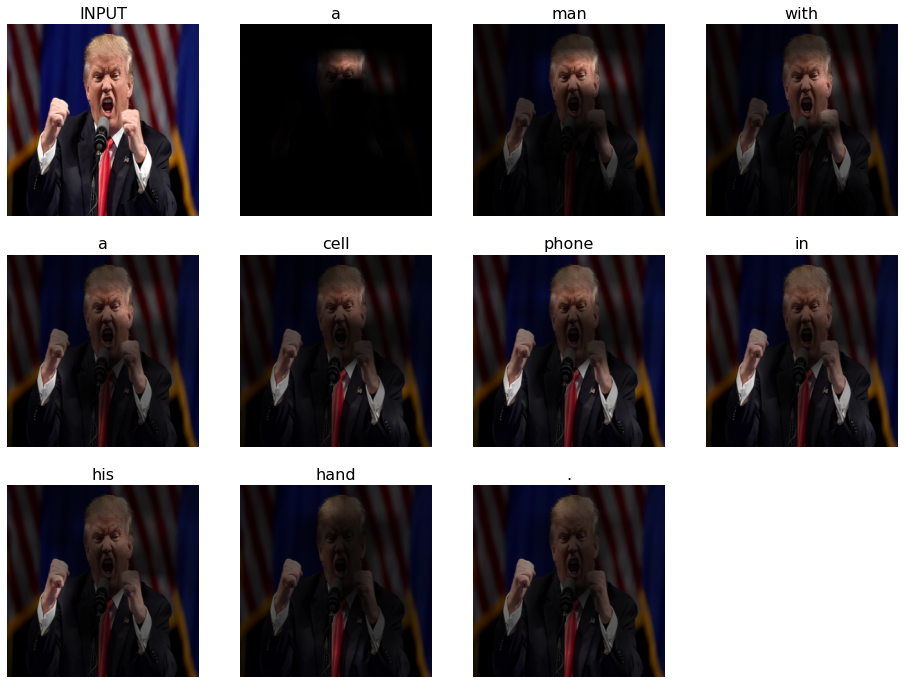

In [363]:
process_image(obtain_image(url="https://c4.wallpaperflare.com/wallpaper/105/1007/714/america-donald-man-men-wallpaper-preview.jpg"))

a man is flying a kite in the air .
a person on a blue tennis court holding a kite .
a red and white photo of a red and white photo of a blue sky .
a person holding a kite in a blue sky .
a person holding a kite in the air .
a person holding a kite in the air .
a person holding a kite in the air .
a person holding a kite in the air .
a person holding a kite in the air .
a person holding a kite in a blue sky .


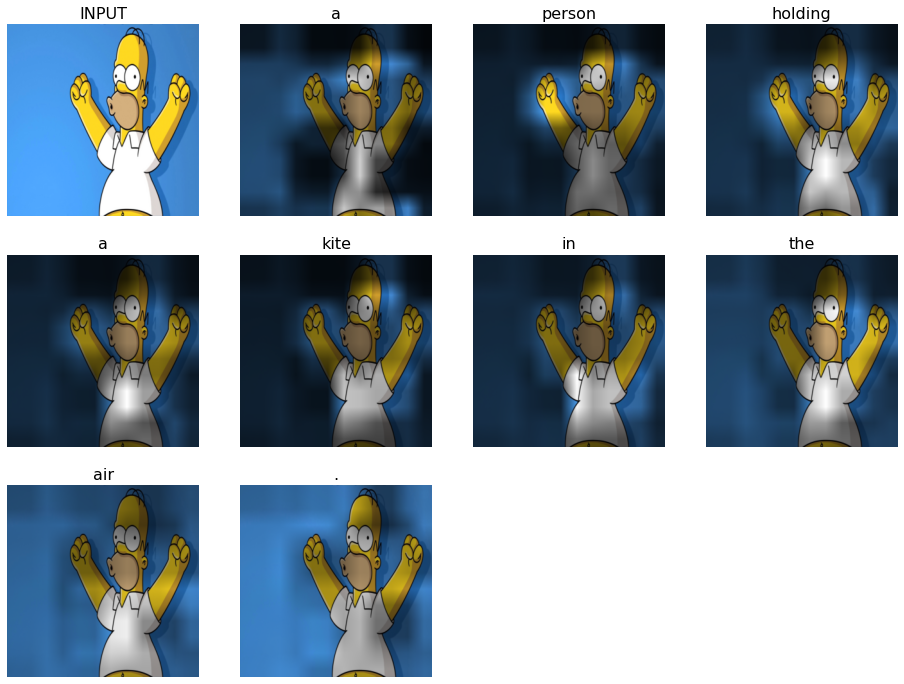

In [364]:
process_image(obtain_image(url="https://images6.alphacoders.com/457/thumb-1920-457065.jpg"))

### Conclusion
Here is a place for your conclusions, observations, hypotheses, and any other feedback.

In [ ]:
#the results may be not so good, i think the reason of this is in the error i got in training(it was like OSError: Can't read data (wrong B-tree signature)), i couldn't find the fix to save this problem. I think increase of num_epohs will make results better

### Now what? (bonus part of the homework)

Your model produces some captions, but you still strive to improve it? You're damn right to do so. Here are some ideas that go beyond simply "stacking more layers".


### Byte pair encoding

As we've said, you don't want your network to predict a million-size vector of probabilities at each step, so we're gotta make some cuts.

The method for creating in vocabulary that we've used is to leave only the most frequently occurring words, but this will introduce an #UNK# token for the words that are not in the dictionary.

BPE will also allow us to have a dictionary of a fixed size, but will be able to process __ANY__ input word. We suggest using the [github implementation](https://github.com/rsennrich/subword-nmt) of the paper ["Neural Machine Translation of Rare Words with Subword Units"](https://arxiv.org/pdf/1508.07909.pdf).

Here is an example usage of a BPE encoder. To complete this part you will have to apply this encoder to the captions you've used, but mind the format, it accepts raw text, not json.

In [ ]:
# bpe is done using subword-nmt package
#!pip install subword-nmt
!{sys.executable} -m pip install subword-nmt

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip available: 22.2.2 -> 22.3
[notice] To update, run: /Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip


In [ ]:
example_text = """closeup of bins of food that include broccoli and bread .
a meal is presented in brightly colored plastic trays ."""

In [ ]:
!echo "{example_text}" | subword-nmt get-vocab

of 2
. 2
closeup 1
bins 1
food 1
that 1
include 1
broccoli 1
and 1
bread 1
a 1
meal 1
is 1
presented 1
in 1
brightly 1
colored 1
plastic 1
trays 1


In [ ]:
!echo "{example_text}" | subword-nmt learn-bpe --symbols 8 --verbose > example_codes.txt

  0%|                                                     | 0/8 [00:00<?, ?it/s]pair 0: r e -> re (frequency 3)
pair 1: s e -> se (frequency 2)
pair 2: o l -> ol (frequency 2)
pair 3: o f</w> -> of</w> (frequency 2)
pair 4: i n -> in (frequency 2)
pair 5: c ol -> col (frequency 2)
pair 6: c l -> cl (frequency 2)
pair 7: b r -> br (frequency 2)
100%|##########################################| 8/8 [00:00<00:00, 15384.88it/s]


note: \</w\> is an end-of-word marker. f\</w\> means that it is a token f that occurs exactly at the end of a word

The output of bpe learning is a list of rules of how to merge pairs of tokens

In [ ]:
with open('example_codes.txt') as f:
    print(f.read())

#version: 0.2
r e
s e
o l
o f</w>
i n
c ol
c l
b r



In [ ]:
tokens = !echo "{example_text}" | subword-nmt apply-bpe -c example_codes.txt
tokens

['cl@@ o@@ se@@ u@@ p of b@@ in@@ s of f@@ o@@ o@@ d t@@ h@@ a@@ t in@@ cl@@ u@@ d@@ e br@@ o@@ c@@ col@@ i a@@ n@@ d b@@ re@@ a@@ d .',
 'a m@@ e@@ a@@ l i@@ s p@@ re@@ se@@ n@@ t@@ e@@ d i@@ n br@@ i@@ g@@ h@@ t@@ l@@ y col@@ o@@ re@@ d p@@ l@@ a@@ s@@ t@@ i@@ c t@@ r@@ a@@ y@@ s .']


#### Attention
You can build better and more interpretable captioning model with attention over the generated part of the sentense.


#### Reinforcement learning
* After your model has been pre-trained in a teacher forced way, you can tune for captioning-speific models like CIDEr.
* Tutorial on RL for sequence models: [practical_rl week8](https://github.com/yandexdataschool/Practical_RL/tree/master/week8_scst)
* Theory: https://arxiv.org/abs/1612.00563